# Task 2. Julia Set. & Task 3. Schelling's Model

Nikolay Zherdev

These sources were used:

https://www.ibm.com/developerworks/community/blogs/jfp/entry/How_To_Compute_Mandelbrodt_Set_Quickly?lang=en

https://scipython.com/book/chapter-7-matplotlib/problems/p72/the-julia-set/

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm


### Julia set

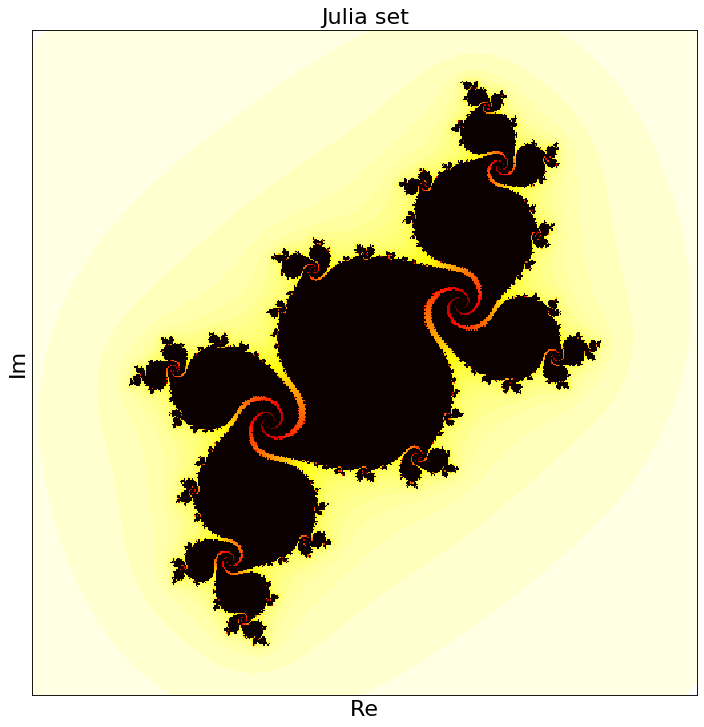

In [2]:
# c = complex(-0.1, 0.65)
c = -0.15+0.66j

imgx, imgy = 500, 500
xmin, xmax, ymin, ymax = -1.5, 1.5, -1.5, 1.5
max_iter = 255 
z_abs_max = 5
xwidth = xmax - xmin
yheight = ymax - ymin

julia = np.zeros((imgx, imgy))

for ix in range(imgx):
    for iy in range(imgy):
        n_it = 0

        # Map pixel position to a point in the complex plane
        z = complex(ix / imgx * xwidth + xmin,
                    iy / imgy * yheight + ymin)

        while abs(z) <= z_abs_max and n_it < max_iter:
            z = z**2 + c
            n_it += 1
        shade = 1-np.sqrt(n_it / max_iter)
        julia[ix,iy] = shade

fig, ax = plt.subplots(figsize=(14, 11), dpi=80)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
plt.xlabel("Re", fontsize=20)
plt.ylabel("Im", fontsize=20)
plt.title("Julia set", fontsize=20)
ax.imshow(julia, interpolation='nearest', cmap=cm.hot)
plt.show()

### Golden ratio

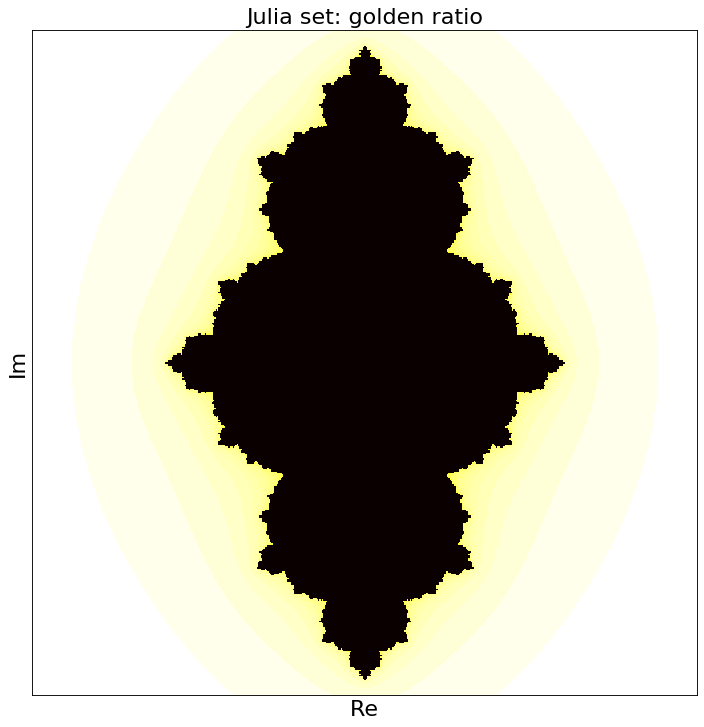

In [3]:
c = 1-(1+np.sqrt(5))/2

imgx, imgy = 500, 500
xmin, xmax, ymin, ymax = -1.5, 1.5, -1.5, 1.5
max_iter = 255 
z_abs_max = 5
xwidth = xmax - xmin
yheight = ymax - ymin

julia = np.zeros((imgx, imgy))

for ix in range(imgx):
    for iy in range(imgy):
        n_it = 0

        # Map pixel position to a point in the complex plane
        z = complex(ix / imgx * xwidth + xmin,
                    iy / imgy * yheight + ymin)

        while abs(z) <= z_abs_max and n_it < max_iter:
            z = z**2 + c
            n_it += 1
        shade = 1-np.sqrt(n_it / max_iter)
        julia[ix,iy] = shade

fig, ax = plt.subplots(figsize=(14, 11), dpi=80)
ax.imshow(julia, interpolation='nearest', cmap=cm.hot)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
plt.title("Julia set: golden ratio", fontsize=20)
plt.xlabel("Re", fontsize=20)
plt.ylabel("Im", fontsize=20)
plt.show()

### Mandelbrot set

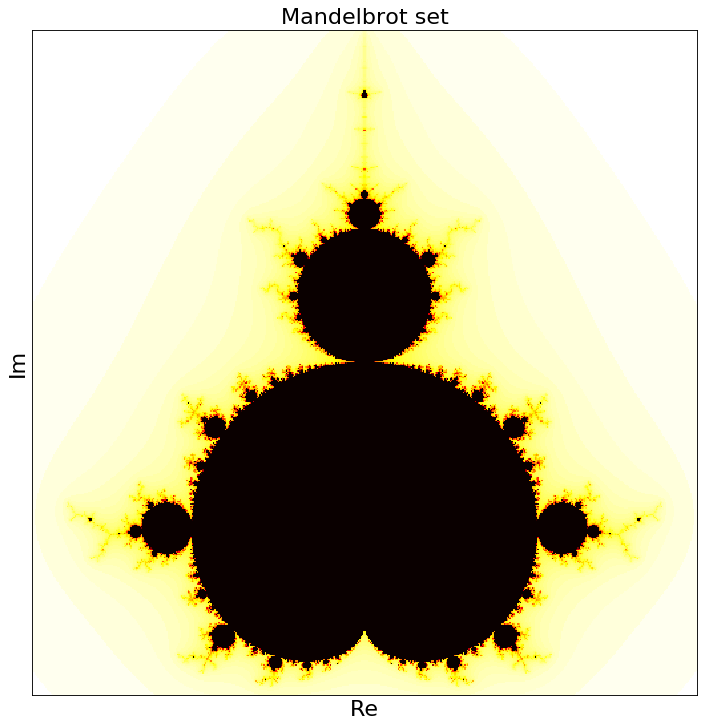

In [4]:
imgx, imgy = 500, 500
xmin, xmax, ymin, ymax = -2.0, 0.5, -1.25, 1.25
max_iter = 255 
z_abs_max = 5

def mandelbrot(c, max_iter, z_abs_max):
    z = 0
    n_it = 0
    while abs(z) <= z_abs_max and n_it < max_iter:
        z = z*z + c
        n_it += 1
    shade = 1 - np.sqrt(n_it / max_iter)
    return shade #n_it

def mandelbrot_set(xmin, xmax, ymin, ymax, imgx, imgy, max_iter):
    re = np.linspace(xmin, xmax, imgx)
    im = np.linspace(ymin, ymax, imgy)
    img = np.empty((imgx, imgy))
    for i in range(imgx):
        for j in range(imgy):
            img[i,j] = mandelbrot(re[i] + 1j*im[j], max_iter, z_abs_max)
    return (re, im, img)

result = mandelbrot_set(xmin, xmax, ymin, ymax, imgx, imgy, max_iter)



fig, ax = plt.subplots(figsize=(14, 11), dpi=80)
ax.imshow(result[2], interpolation='nearest', cmap=cm.hot)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
plt.title("Mandelbrot set", fontsize=20)
plt.xlabel("Re", fontsize=20)
plt.ylabel("Im", fontsize=20)
plt.show()

### Create a gif from saved pictures

In [0]:
import imageio
import os

def draw_gif1(title):
    """
    TODO: add specific folder, now problem in a line # list(map(lambda ...
    """
    path = '/content'
    image_folder = os.fsencode(path)
    print(image_folder)
    filenames = []

    for file in os.listdir(image_folder):
        filename = os.fsdecode(file)
        if filename.endswith( ('.jpeg', '.png', '.gif') ):
            filenames.append(filename)

    filenames.sort() # this iteration technique has no built in order, so sort the frames
    images = list(map(lambda filename: imageio.imread(filename), filenames))
    imageio.mimsave(os.path.join(title), images, duration=0.05)

In [22]:
!rm *

rm: cannot remove 'sample_data': Is a directory


### Julia set  c = exp(ia), a = range(0, 2pi)

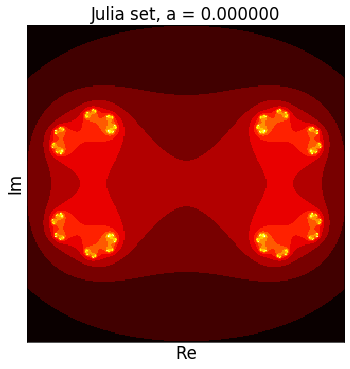

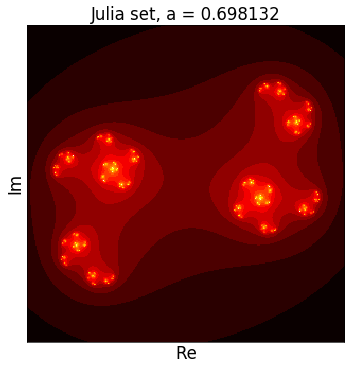

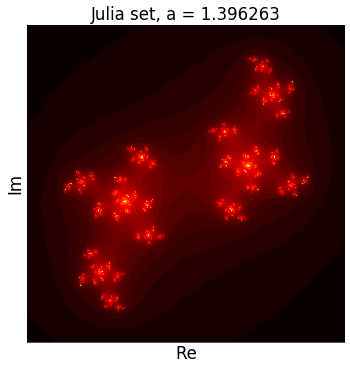

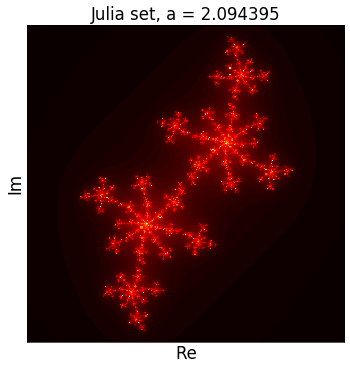

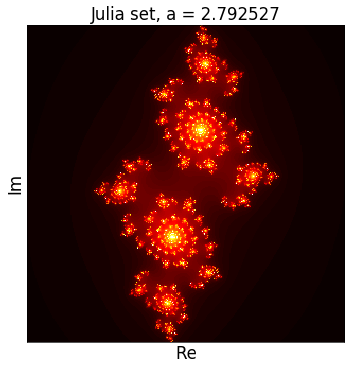

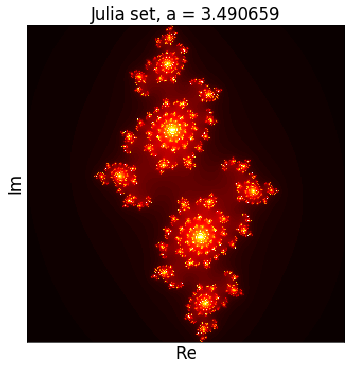

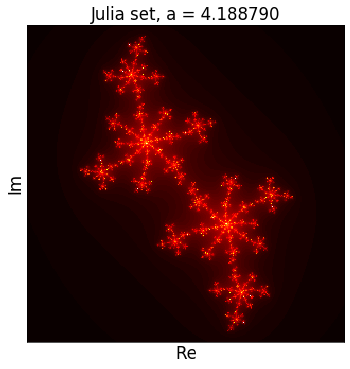

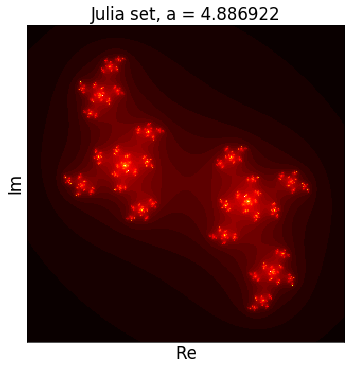

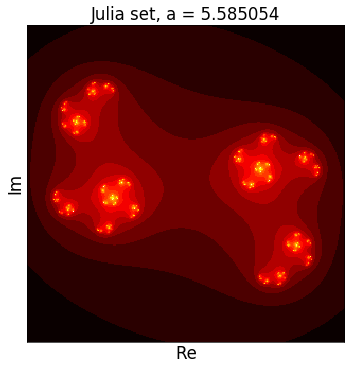

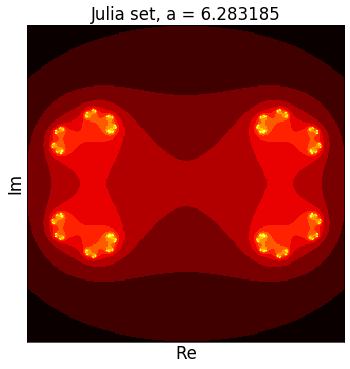

b'/content'


In [4]:
imgx, imgy = 300, 300
xmin, xmax, ymin, ymax = -1.5, 1.5, -1.5, 1.5
max_iter = 100
z_abs_max = 3
xwidth = xmax - xmin
yheight = ymax - ymin

def calc_julia(c, ix, iy, max_iter, z_abs_max):
    n_it = 0

    # Map pixel position to a point in the complex plane
    z = complex(ix / imgx * xwidth + xmin,
                iy / imgy * yheight + ymin)

    while abs(z) <= z_abs_max and n_it < max_iter:
        z = z**2 + c
        n_it += 1

    shade = n_it / max_iter
    return "%.2f" % round(shade,2)

def julia_set(xmin, xmax, ymin, ymax, imgx, imgy, max_iter):
    vals = np.linspace(0, 2*np.pi, num=10)
    for i, a in enumerate(vals):
        i+=100
        c = 0.7885*np.exp(complex(0, 1)*a)
        julia = np.zeros((imgx, imgy))

        for ix in range(imgx):
            for iy in range(imgy):
                julia[ix,iy] = calc_julia(c, ix, iy, max_iter, z_abs_max)


        # fig, ax = plt.subplots(figsize=(14, 11), dpi=80)
        fig, ax = plt.subplots(figsize=(7, 7), dpi=60)
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title("Julia set, a = %f" % a, fontsize=20)
        plt.xlabel("Re", fontsize=20)
        plt.ylabel("Im", fontsize=20)
        ax.imshow(julia, interpolation='nearest', cmap=cm.hot)
        plt.savefig('{}.png'.format(str(i)))
        plt.show()

    draw_gif1(title='julie_test' + ".gif")
    
    return julia
            
julia = julia_set(xmin, xmax, ymin, ymax, imgx, imgy, max_iter)

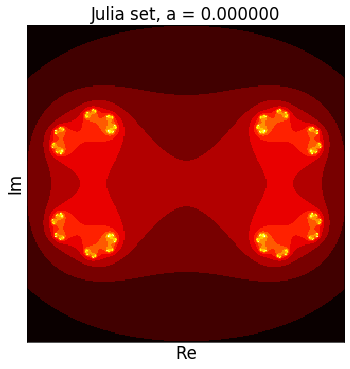

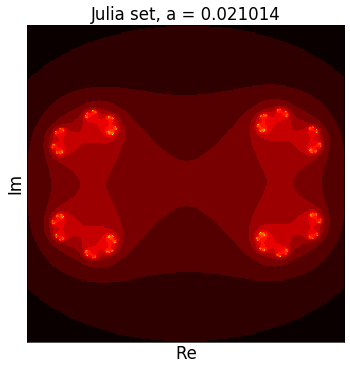

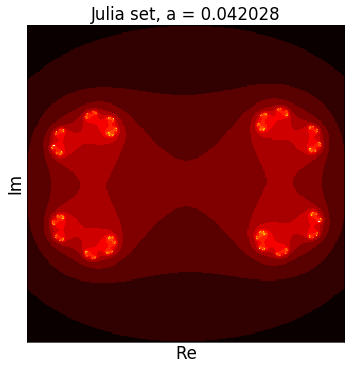

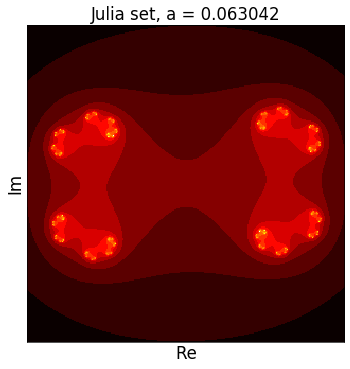

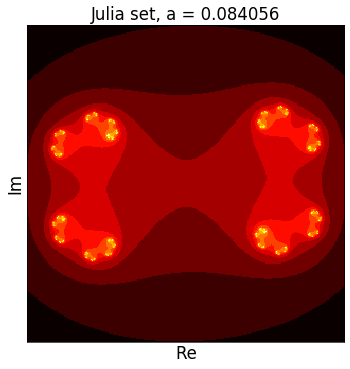

...

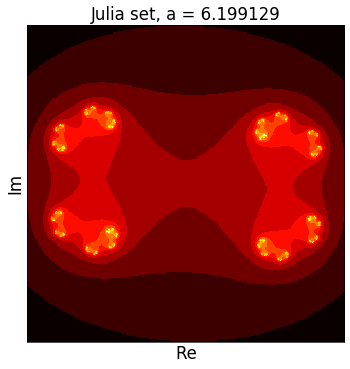

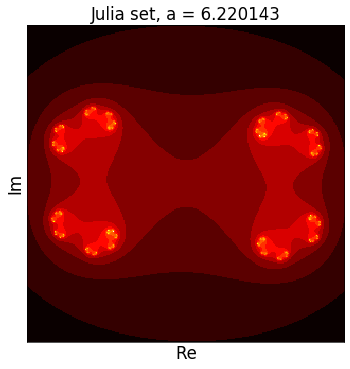

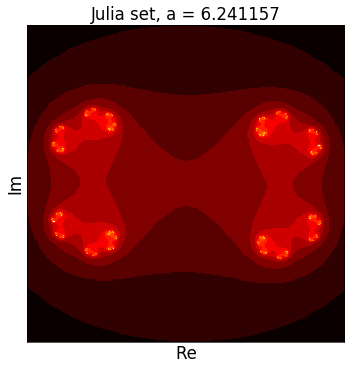

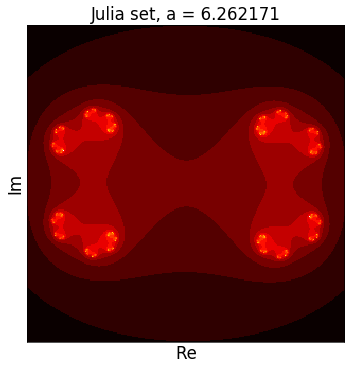

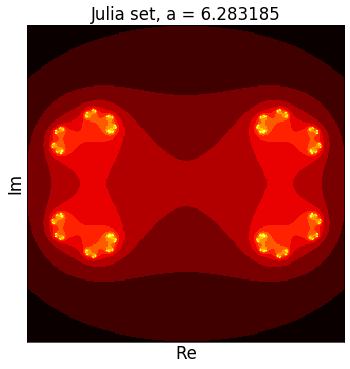

b'/content'


In [23]:
imgx, imgy = 300, 300
xmin, xmax, ymin, ymax = -1.5, 1.5, -1.5, 1.5
max_iter = 100
z_abs_max = 3
xwidth = xmax - xmin
yheight = ymax - ymin

ims = []

vals = np.linspace(0, 2*np.pi, num=300)
for i, a in enumerate(vals):
    i+=100
    c = 0.7885*np.exp(complex(0, 1)*a)
    julia = np.zeros((imgx, imgy))

    for ix in range(imgx):
        for iy in range(imgy):
            n_it = 0

            # Map pixel position to a point in the complex plane
            z = complex(ix / imgx * xwidth + xmin,
                        iy / imgy * yheight + ymin)

            while abs(z) <= z_abs_max and n_it < max_iter:
                z = z**2 + c
                n_it += 1
            shade = n_it / max_iter
            # shade = 1-np.sqrt(n_it / max_iter)
            # julia[ix,iy] = shade
            julia[ix,iy] = "%.2f" % round(shade,2)
            
    # fig, ax = plt.subplots(figsize=(14, 11), dpi=80)
    fig, ax = plt.subplots(figsize=(7, 7), dpi=60)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.title("Julia set, a = %f" % a, fontsize=20)
    plt.xlabel("Re", fontsize=20)
    plt.ylabel("Im", fontsize=20)
    ax.imshow(julia, interpolation='nearest', cmap=cm.hot)
    plt.savefig('{}.png'.format(str(i)))
    plt.show()

draw_gif1(title='julie_test' + ".gif")

### Schelling’s Model (without free spaces)

In [0]:
def neighbors(a, radius, rowNumber, columnNumber):
    """
    a - population
    radius - size of kernel

    returns: sub-matrix of neighbors for a given agent. 
              Agents at the corners and borders receive "0" for each imaginary
              neighbor

              TODO: make world like a sphere, so corner agent is neighboring 
              agent on the opposite side
    """
    rowNumber = rowNumber + 1
    columnNumber = columnNumber + 1

    neighbors = [[a[i][j] if  i >= 0 and i < len(a) and j >= 0 and j < len(a[0]) else 0
        for j in range(columnNumber-1-radius, columnNumber+radius)]
            for i in range(rowNumber-1-radius, rowNumber+radius)]

    return np.array(neighbors)

# TESTS
# a = np.arange(36).reshape((6, 6))
# print(a)
# print(" ")
# print(neighbors(a, 1, 0, 0))
# print(" ")
# print(neighbors(a, 1, 2, 2))
# print(" ")
# print(neighbors(a, 2, 3, 3))
# print(" ")

In [0]:
def generate_map(grid_size=(10, 10), saturation=1):
    """
    Generates map for two types of agents: X and O distributed randomly

    grid_size - size of the grid, tuple of two values
    saturation - from 0 to 1, the ratio of occupied/available spaces
    """
    x, y = grid_size
    population = np.random.choice([-1, 1], x*y, p=[0.5, 0.5]).reshape((x, y))

    c = int(x * y * (1 - saturation))
    mask = np.zeros((x, y), dtype=bool)
    mask.ravel()[:c] = True
    np.random.shuffle(mask.ravel())
    population[mask] = 0

    return population

# TESTS
# population1 = generate_map(grid_size=(5, 5))
# print(population1)
# print(" ")

# population2 = generate_map(grid_size=(5, 5), saturation=0.9)
# print(population2)
# print(" ")

In [0]:
def calc_satisfaction(a, thres):
    """
    For each agent calculates if he is satisfied with his current location. 
    A satisfied agent is one that is surrounded by at least t percent 
    of agents that are like himself. This threshold t is one that will 
    apply to all agents in the model.

    a - population matrix
    thres - threshold for satisfaction

    returns: a satisf. matrix where: 10=satisfied, -1=unsatisfied, 0=empty_space
    """

    satisfactions = []

    for x in range(a.shape[0]):
        for y in range(a.shape[1]):
            if a[x][y] == 0:
                satisfactions.append(np.nan)
            else:
                similar_neighbors = np.count_nonzero(neighbors(a, 1, x, y) == a[x][y]) - 1
                satisfactions.append(similar_neighbors/8)

    satisfactions = np.array(satisfactions).reshape(a.shape)

    sm = np.zeros(satisfactions.shape)
    sm[satisfactions<thres] = -1
    sm[satisfactions>thres] = 10

    return sm

# TESTS
# population = generate_map(grid_size=(7, 7))
# print(population)
# print(" ")
# sm = calc_satisfaction(population, thres=0.3)
# print(sm)

In [0]:
def choose_new_loc(population, sm, policy="naive"):
    """
    This function is for rules with free spaces. 
    Without free space check "def permutate_unsatisfied_agents_no_spaces"

    sm - satisfaction matrix
    policy - move to new loc randomly, or to the nearest available position

    returns: matrix, where each unsatisf. agent moved to one of available spaces
    """
    population_remix = population.copy()

    if policy == "naive":
        for x in range(population_remix.shape[0]):
            for y in range(population_remix.shape[1]):
                
                # print("calc free_cells")
                free_cells = np.argwhere(population_remix==0)
                # print("free_cells are:")
                # print(free_cells)
                first_free_cell = free_cells[0]  # (x, y) coords
                ffcx = first_free_cell[0]
                ffcy = first_free_cell[1]
                # print(" ")

                if sm[x][y] == -1:
                    population_remix[ffcx][ffcy] = population_remix[x][y]
                    population_remix[x][y] = 0
                    # print("after remix: ")
                    # print(population_remix)
                # else:
                #     print("satisfied or free space here")
    # print("")
    # print("population after one round:")
    # print(population_remix)
    return population_remix

In [0]:
def permutate_unsatisfied_agents_no_spaces(population, sm):
    """
    Just randomly uniformly permutates subset of a matrix

    returns: matrix
    """
    mask = np.zeros_like((sm), dtype=bool)
    mask[sm == -1] = True

    # extract them with permutation
    permutted = np.random.permutation(population[mask])
    # print(permutted)

    # return permutaed array by indexes back to origin
    population[mask] = permutted
    # print(population)

    return population

# TESTS
# population = generate_map(grid_size=(4, 4))
# print(population)
# print(" ")
# sm = calc_satisfaction(population, thres=0.3)
# print(sm)
# print(" ")
# population_permutated = permutate_unsatisfied_agents_no_spaces(population, sm)
# print(population_permutated)
# print(" ")
# sm_perm = calc_satisfaction(population_permutated, thres=0.3)
# print(sm_perm)

In [0]:
def run_world(grid_size, thres, rounds, to_plot):
    """
    rounds - number of rounds for simulation

    """
    population = generate_map(grid_size=grid_size)
    sm = calc_satisfaction(population, thres=thres)

    rounds = np.arange(rounds)  # round 0 is initial distribution
    moving_houses = []
    initial_unsatisfied = np.count_nonzero(sm == -1)
    moving_houses.append(initial_unsatisfied)

    for i in rounds[1:]:
        # with free spaces
        # population_end = choose_new_loc(population, sm)

        # without free spaces
        population_end = permutate_unsatisfied_agents_no_spaces(population, sm)
        population = population_end
        # print("population after %d round" % (i))
        # print(population)
        # print("")

        sm = calc_satisfaction(population, thres=thres)
        # print("satisfactions matrix after %d round" % (i))
        # print(sm)
        # print("")
        unsatisfied = np.count_nonzero(sm == -1)
        moving_houses.append(unsatisfied)

    if to_plot:
        plt.title("Schelling's model with no spaces, R = {0:.3f}".format(thres))
        plt.xlabel("rounds")
        plt.ylabel("Number of unsatisfied agents")
        plt.plot(rounds, moving_houses)
        plt.show()

    # print("population after %d rounds" % (len(rounds)))
    # print(population)

    # print("initial_population was: ")
    # print(initial_population)
    return moving_houses

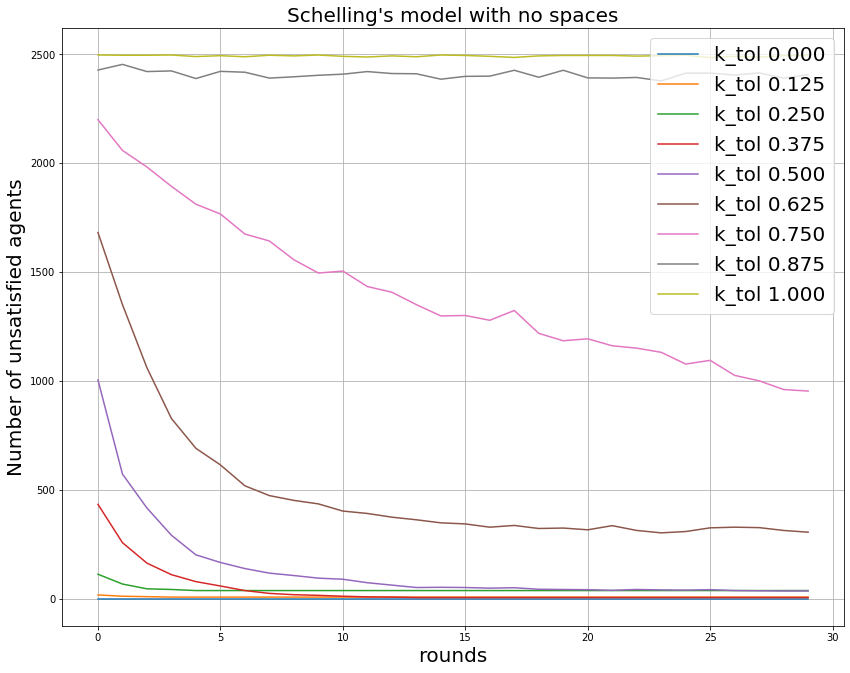

In [13]:
def plot_various_migrations(grid_size=(50, 50), rounds=25):
    R = np.linspace(0, 1, 9)
    worlds = []
    for thres in R:
        moving_houses = run_world(grid_size=grid_size, thres=thres, rounds=rounds, to_plot=False)
        worlds.append(moving_houses)

    fig, ax = plt.subplots(figsize=(14, 11))
    rounds = np.arange(rounds)
    for i, world in enumerate(worlds):
        plt.plot(rounds, world, label='k_tol %.3f'%R[i])

    plt.title("Schelling's model with no spaces", fontsize=20)
    plt.xlabel("rounds", fontsize=20)
    plt.ylabel("Number of unsatisfied agents", fontsize=20)
    plt.legend(loc='upper right', fontsize=20)
    plt.grid()
    plt.show()

plot_various_migrations(grid_size=(50, 50), rounds=30)

In [0]:
def draw_pic(matrix, name, path):
    """
    Draws a black&white map
    """
    fig, ax = plt.subplots(figsize=(6, 6))
    plt.title("Schelling's model with no spaces", fontsize=20)
    plt.imshow(matrix, cmap="gray")
    plt.savefig(path+'/'+'{}.png'.format(str(name)))
    plt.show()

In [0]:
import imageio
import os

def draw_gif(title):
    """
    TODO: add specific folder, now problem in a line # list(map(lambda ...
    """
    path = '/content'
    image_folder = os.fsencode(path)
    print(image_folder)
    filenames = []

    for file in os.listdir(image_folder):
        filename = os.fsdecode(file)
        if filename.endswith( ('.jpeg', '.png') ):
            filenames.append(filename)

    filenames.sort() # this iteration technique has no built in order, so sort the frames
    images = list(map(lambda filename: imageio.imread(filename), filenames))
    imageio.mimsave(os.path.join(title), images, duration=0.15)


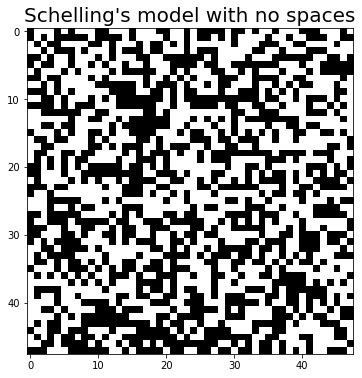

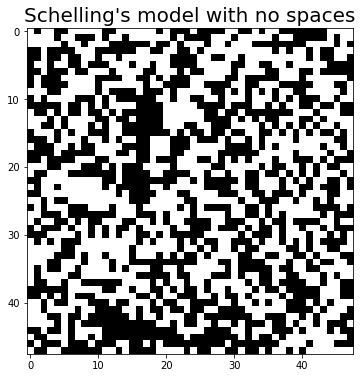

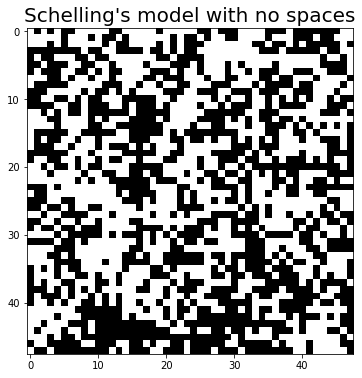

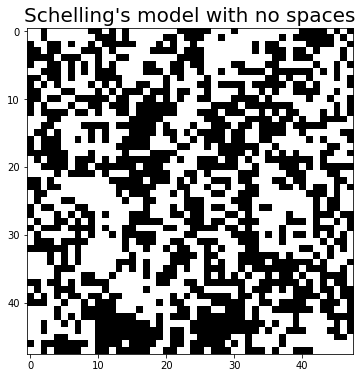

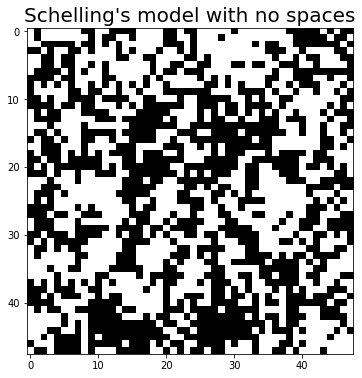

...

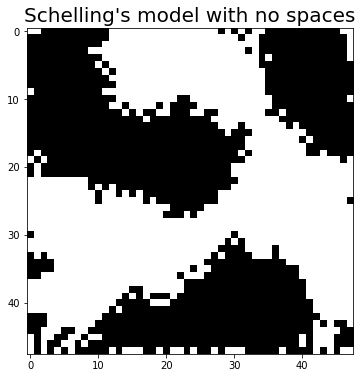

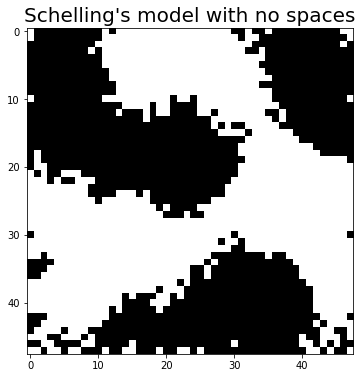

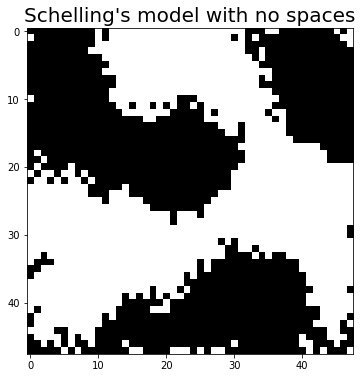

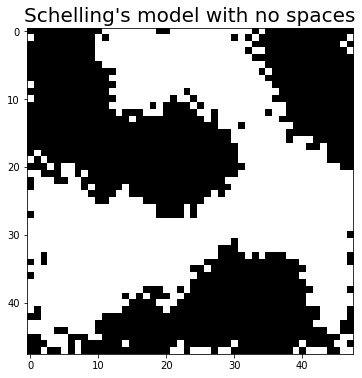

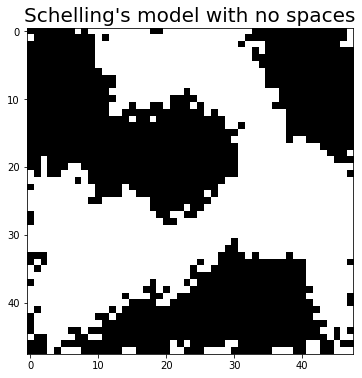

b'/content'


In [30]:
def animate_world(grid_size, thres, rounds, title, path):
    """
    rounds - number of rounds for simulation

    """

    population = generate_map(grid_size=grid_size)
    draw_pic(population[1:-1, 1:-1], 100, path)  # slice to cut 1px borders
    sm = calc_satisfaction(population, thres=thres)
    rounds = np.arange(rounds)  # round 0 is initial distribution

    for i in rounds[1:]:
        i+=100
        population_end = permutate_unsatisfied_agents_no_spaces(population, sm)
        population = population_end
        draw_pic(population_end[1:-1, 1:-1], i, path)
        sm = calc_satisfaction(population, thres=thres)

    draw_gif(title + ".gif")

path = '/content/'
animate_world(grid_size=(50, 50), thres=0.65, rounds=90, title="Shelling's_model5", path=path)